In [1]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import pyvips

# Params
sample_n = 32

# Paths
root = '/media/latlab/MR/projects/kaggle-ubc-ocean'
data_dir = os.path.join(root, 'data')
results_dir = os.path.join(root, 'results')
train_csv = 'train.csv'
train_image_dir = os.path.join(data_dir, 'train_images')
train_thumbnail_dir = os.path.join(data_dir, 'train_thumbnails')
tile_set_name = 'train_tiles_2048_p25_drop60_v7'
tiles_dir = os.path.join(results_dir, tile_set_name)
out_name = tile_set_name

# Load data
df = pd.read_csv(os.path.join(data_dir, train_csv))
df

,image_id,label,image_width,image_height,is_tma
0,4,HGSC,23785,20008,False
1,66,LGSC,48871,48195,False
2,91,HGSC,3388,3388,True
3,281,LGSC,42309,15545,False
4,286,EC,37204,30020,False
...,...,...,...,...,...
533,65022,LGSC,53355,46675,False
534,65094,MC,55042,45080,False
535,65300,HGSC,75860,27503,False
536,65371,HGSC,42551,41800,False


In [2]:
tiles_df = pd.DataFrame(columns=['image_id', 'orig_image_id', 'label', 'is_tma'])
for i, row in df.iterrows():
    orig_image_id = row['image_id']
    try:
        image_id_list = [os.path.splitext(x)[0] for x in os.listdir(os.path.join(tiles_dir, str(orig_image_id)))]
        curr_df = pd.DataFrame({'image_id': image_id_list, 
                                'orig_image_id': orig_image_id, 
                                'label': row['label'], 
                                'orig_image_width': row['image_width'], 
                                'orig_image_height': row['image_height'], 
                                'is_tma': row['is_tma']})
        tiles_df = pd.concat((tiles_df, curr_df))
    except:
        print(f'No tiles for {orig_image_id}')
tiles_df = tiles_df.reset_index(drop=True).astype({'orig_image_width': 'int32', 'orig_image_height': 'int32'})
tiles_df

,image_id,orig_image_id,label,is_tma,orig_image_width,orig_image_height
0,000024_0-4096,4,HGSC,False,23785,20008
1,000025_2048-4096,4,HGSC,False,23785,20008
2,000068_16384-10240,4,HGSC,False,23785,20008
3,000013_2048-2048,4,HGSC,False,23785,20008
4,000079_14336-12288,4,HGSC,False,23785,20008
...,...,...,...,...,...,...
113737,000222_30720-18432,65533,HGSC,False,45190,33980
113738,000182_43008-14336,65533,HGSC,False,45190,33980
113739,000090_43008-6144,65533,HGSC,False,45190,33980
113740,000057_22528-4096,65533,HGSC,False,45190,33980


In [3]:
# Check data
tiles_df.groupby('orig_image_id')['image_id'].count().describe()

count    538.000000
mean     211.416357
std      126.606582
min        1.000000
25%      115.000000
50%      188.500000
75%      288.000000
max      630.000000
Name: image_id, dtype: float64

In [4]:
tiles_df.to_csv(os.path.join(results_dir, f'{out_name}.csv'), index=False)

In [5]:
# Undersample to N tile/image
def sampler(x, n):
    if len(x) <= n:
        return x
    else:
        return x.sample(n)
tiles_df_sample = tiles_df.groupby('orig_image_id').apply(lambda x: sampler(x, sample_n)).reset_index(drop=True)
tiles_df_sample.to_csv(os.path.join(results_dir, f'{out_name}_sample{sample_n}.csv'), index=False)
tiles_df_sample

,image_id,orig_image_id,label,is_tma,orig_image_width,orig_image_height
0,000049_2048-8192,4,HGSC,False,23785,20008
1,000064_8192-10240,4,HGSC,False,23785,20008
2,000054_12288-8192,4,HGSC,False,23785,20008
3,000004_8192-0,4,HGSC,False,23785,20008
4,000015_6144-2048,4,HGSC,False,23785,20008
...,...,...,...,...,...,...
16416,000141_6144-12288,65533,HGSC,False,45190,33980
16417,000305_12288-26624,65533,HGSC,False,45190,33980
16418,000034_22528-2048,65533,HGSC,False,45190,33980
16419,000076_14336-6144,65533,HGSC,False,45190,33980


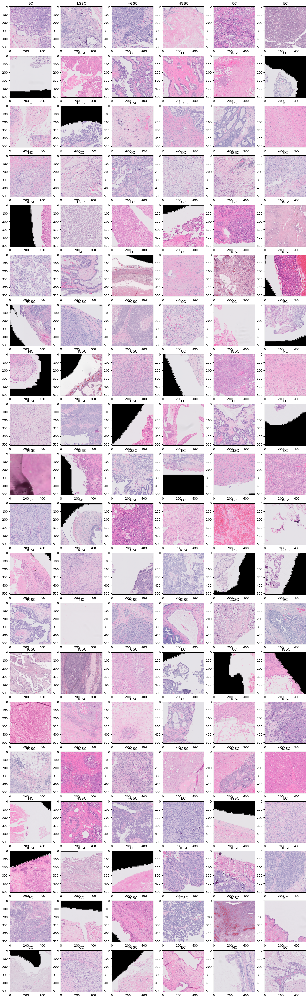

In [7]:
nrows = 20
ncols = 6

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3, nrows*3))
for i, row in tiles_df_sample.sample(frac=1, ignore_index=True).iterrows():
    if i >= (nrows*ncols):
        break
    img_path = os.path.join(tiles_dir, str(row['orig_image_id']), str(row['image_id'] + '.png'))
    img = pyvips.Image.new_from_file(img_path).numpy()
    # if np.max(img) > 1.5:
    #     img = img / 255.0
    ax = axes[i // ncols, i % ncols]
    ax.set_title(row['label'])
    ax.imshow(img)

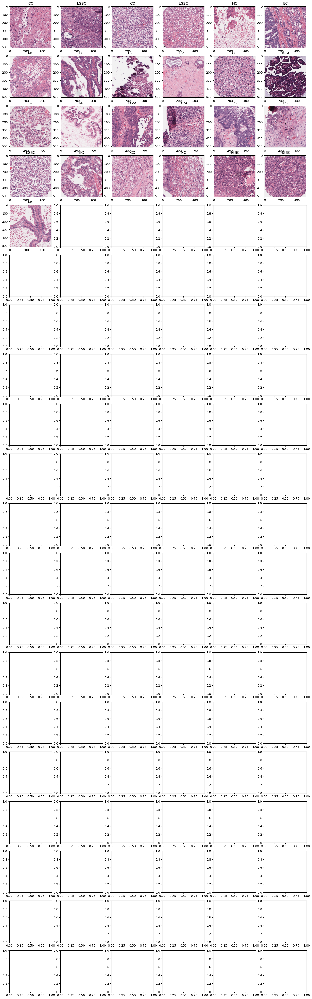

In [8]:
nrows = 20
ncols = 6

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3, nrows*3))
for i, row in tiles_df_sample[tiles_df_sample.is_tma==True].sample(frac=1, ignore_index=True).iterrows():
    if i >= (nrows*ncols):
        break
    img_path = os.path.join(tiles_dir, str(row['orig_image_id']), str(row['image_id'] + '.png'))
    img = pyvips.Image.new_from_file(img_path).numpy()
    # if np.max(img) > 1.5:
    #     img = img / 255.0
    ax = axes[i // ncols, i % ncols]
    ax.set_title(row['label'])
    ax.imshow(img)